In [ ]:
import os
import sys
import torch

# 1. Hardware Check
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"✅ Hardware: {device} ({torch.cuda.get_device_name(0) if torch.cuda.is_available() else 'CPU'})")

# 2. Clean Clone
REPO_URL = "https://github.com/Kaankocc/autovision-cityscapes.git"
REPO_NAME = "autovision-cityscapes"

if os.path.exists(REPO_NAME):
    !rm -rf {REPO_NAME} # Remove existing directory to ensure a fresh clone

print(f"🚀 Cloning fresh repository...")
!git clone {REPO_URL}

# 3. Path Configuration
PROJECT_ROOT = os.path.abspath(REPO_NAME)
SRC_PATH = os.path.join(PROJECT_ROOT, "src")
if SRC_PATH not in sys.path:
    sys.path.insert(0, SRC_PATH)

✅ Hardware: cuda (Tesla T4)
🚀 Cloning fresh repository...
Cloning into 'autovision-cityscapes'...
remote: Enumerating objects: 22, done.
remote: Counting objects: 100% (22/22), done.
remote: Compressing objects: 100% (18/18), done.
remote: Total 22 (delta 4), reused 20 (delta 2), pack-reused 0 (from 0)
Receiving objects: 100% (22/22), 9.25 MiB | 29.04 MiB/s, done.
Resolving deltas: 100% (4/4), done.


In [2]:
import importlib

def fix_and_load():
    files = ['utils.py', 'dataset.py', 'model.py']
    for filename in files:
        path = os.path.join(SRC_PATH, filename)
        with open(path, 'r') as f:
            content = f.read()
        
        # Strip 'src.' prefixes if present
        if 'from src.' in content:
            with open(path, 'w') as f:
                f.write(content.replace('from src.', 'from '))
            print(f"🛠️  Cleaned imports in {filename}")

    # Fresh imports
    import dataset, model, utils
    importlib.reload(dataset)
    importlib.reload(model)
    importlib.reload(utils)
    return dataset, model, utils

dataset, model, utils = fix_and_load()
from dataset import CityscapesKaggleDataset
from model import UNet
from utils import bake_masks

print("\n🚀 SUCCESS: Modular code is ready for research-grade training.")

🛠️  Cleaned imports in utils.py

🚀 SUCCESS: Modular code is ready for research-grade training.


In [ ]:
import os
import shutil
from utils import bake_masks

# 1. Define Paths
RAW_DATA = "/kaggle/input/cityscapes-image-pairs/cityscapes_data/cityscapes_data" 
PROC_DATA = "/kaggle/working/processed_masks"

# 2. Safety Check
if not os.path.exists(os.path.join(RAW_DATA, 'train')):
    print(f"❌ Error: '{RAW_DATA}/train' still not found. Please double-check the RAW_DATA string.")
else:
    if os.path.exists(PROC_DATA):
        shutil.rmtree(PROC_DATA)
        print("🗑️  Cleared old processed_masks.")

    print(f"🔥 Baking masks from: {RAW_DATA}")
    print("Converting JPGs to single-channel PNGs at 512x512...")
    
    # This calls the function you just fixed and imported
    bake_masks(RAW_DATA, PROC_DATA)
    
    print(f"\n✅ SUCCESS: Masks are baked and ready at {PROC_DATA}")

🔥 Baking masks from: /kaggle/input/cityscapes-image-pairs/cityscapes_data/cityscapes_data
Converting JPGs to single-channel PNGs at 512x512...
🔥 Baking 2975 masks for 'train' split...


100%|██████████| 2975/2975 [02:14<00:00, 22.08it/s]


🔥 Baking 500 masks for 'val' split...


100%|██████████| 500/500 [00:22<00:00, 22.11it/s]


✅ SUCCESS: Masks are baked and ready at /kaggle/working/processed_masks


In [ ]:
import torch
import torch.nn as nn
from torch.utils.data import DataLoader
from dataset import CityscapesKaggleDataset
from model import UNet

# 1. Device Selection (Ensures you're using that T4 GPU)
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# 2. Initialize DataLoaders
train_ds = CityscapesKaggleDataset(root_dir=RAW_DATA, target_size=(512, 512))
train_loader = DataLoader(train_ds, batch_size=8, shuffle=True)

# 3. Initialize the Deeper UNet
model_instance = UNet(n_channels=3, n_classes=7).to(device)

# 4. Weighted Loss Function
class_weights = torch.tensor([1.0, 0.8, 5.0, 2.0, 1.0, 15.0, 1.0]).to(device)
criterion = nn.CrossEntropyLoss(weight=class_weights)

# 5. Optimizer
optimizer = torch.optim.Adam(model_instance.parameters(), lr=1e-4)

print(f"✅ Initialized deeper UNet on {device}")
print(f"✅ Ready for 512x512 training with batch size 8")

✅ Initialized deeper UNet on cuda
✅ Ready for 512x512 training with batch size 8


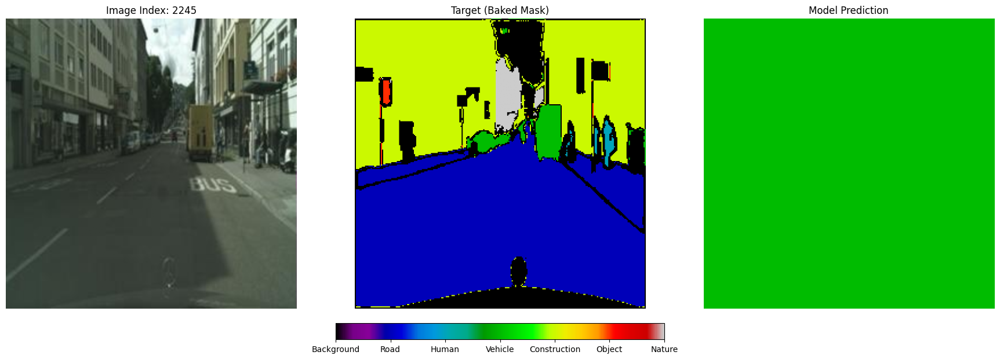

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

CATEGORIES = ["Background", "Road", "Human", "Vehicle", "Construction", "Object", "Nature"]

def visualize_with_labels(model, dataset, device, index=None):
    model.eval()
    if index is None:
        index = np.random.randint(0, len(dataset))
    
    image, mask = dataset[index]
    
    with torch.no_grad():
        input_tensor = image.unsqueeze(0).to(device)
        output = model(input_tensor)
        prediction = torch.argmax(output.squeeze(), dim=0).cpu().numpy()

    fig, ax = plt.subplots(1, 3, figsize=(22, 8))
    
    # 1. Original
    ax[0].imshow(image.permute(1, 2, 0).numpy())
    ax[0].set_title(f"Image Index: {index}")
    ax[0].axis('off')
    
    # 2. Ground Truth
    gt_plot = ax[1].imshow(mask, cmap='nipy_spectral', vmin=0, vmax=6)
    ax[1].set_title("Target (Baked Mask)")
    ax[1].axis('off')
    
    # 3. Prediction
    pred_plot = ax[2].imshow(prediction, cmap='nipy_spectral', vmin=0, vmax=6)
    ax[2].set_title("Model Prediction")
    ax[2].axis('off')

    # Add a colorbar to see which color is which class
    cbar = fig.colorbar(pred_plot, ax=ax, orientation='horizontal', fraction=0.046, pad=0.04)
    cbar.set_ticks(np.arange(7))
    cbar.set_ticklabels(CATEGORIES)
    
    plt.show()

# Run it
visualize_with_labels(model_instance, train_ds, device)

📡 Starting 512x512 training on cuda...


Epoch 1/30: 100%|██████████| 372/372 [19:38<00:00,  3.17s/it, loss=0.7551]


🏁 Epoch 1 Summary | Avg Loss: 1.0288


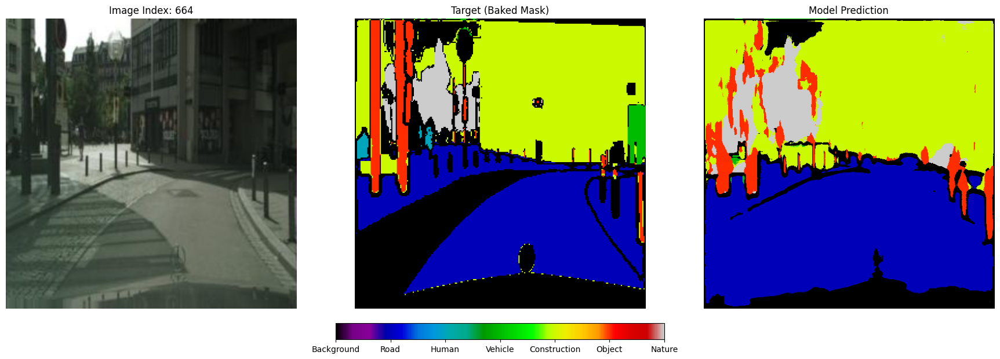

⭐ New Best Model Saved!


Epoch 2/30: 100%|██████████| 372/372 [19:54<00:00,  3.21s/it, loss=0.6755]


🏁 Epoch 2 Summary | Avg Loss: 0.7242


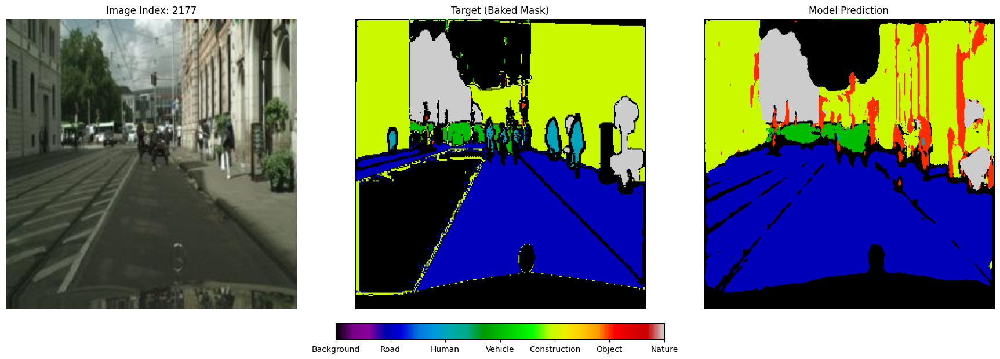

⭐ New Best Model Saved!


Epoch 3/30: 100%|██████████| 372/372 [19:53<00:00,  3.21s/it, loss=0.5315]


🏁 Epoch 3 Summary | Avg Loss: 0.6290


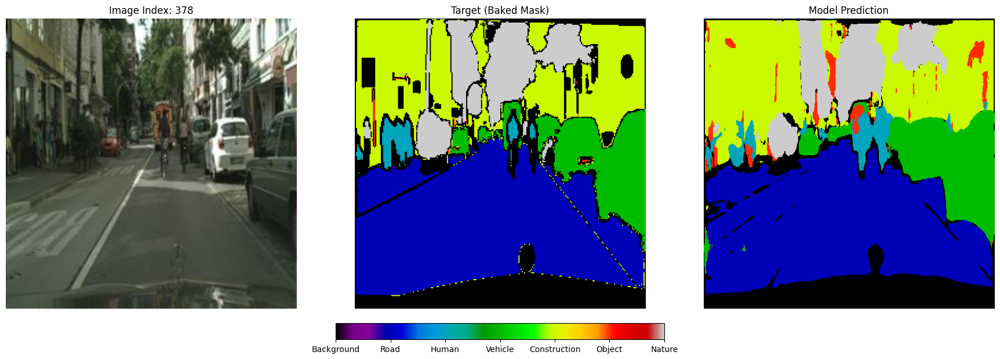

⭐ New Best Model Saved!


Epoch 4/30: 100%|██████████| 372/372 [19:47<00:00,  3.19s/it, loss=0.7200]


🏁 Epoch 4 Summary | Avg Loss: 0.5749


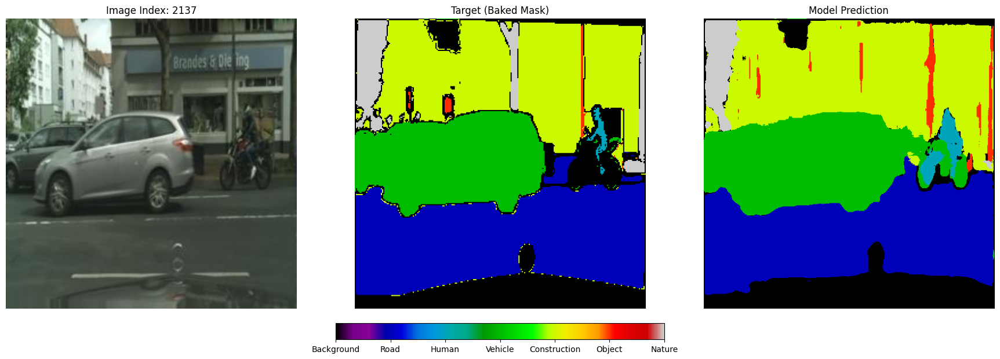

⭐ New Best Model Saved!


Epoch 5/30: 100%|██████████| 372/372 [19:38<00:00,  3.17s/it, loss=0.4572]


🏁 Epoch 5 Summary | Avg Loss: 0.5298


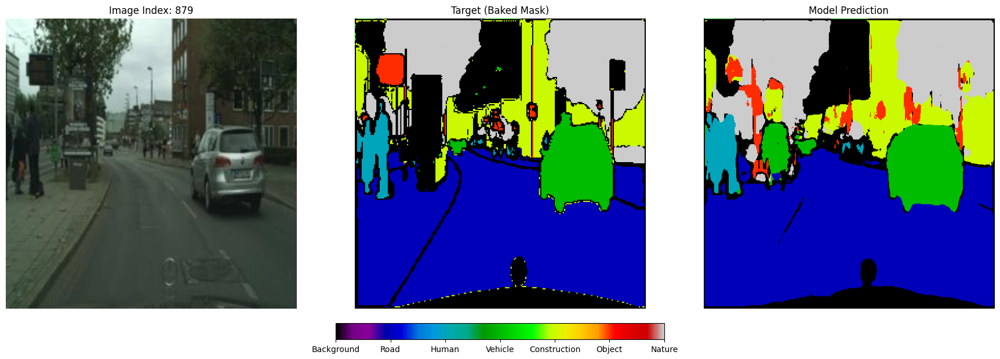

⭐ New Best Model Saved!


Epoch 6/30: 100%|██████████| 372/372 [19:44<00:00,  3.18s/it, loss=0.4164]


🏁 Epoch 6 Summary | Avg Loss: 0.4995


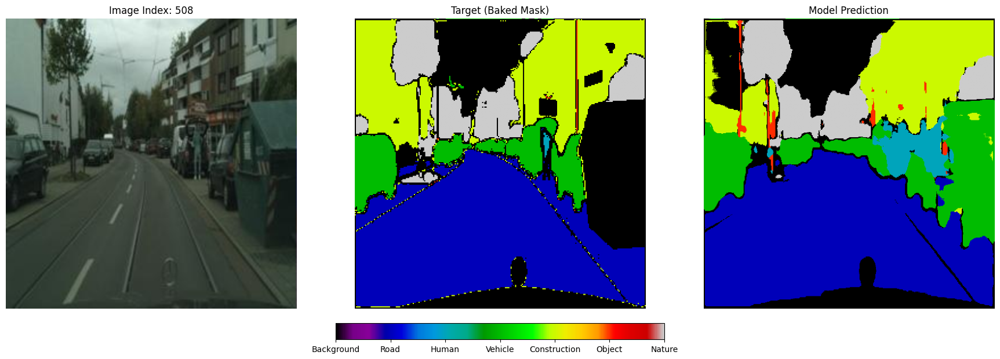

⭐ New Best Model Saved!


Epoch 7/30: 100%|██████████| 372/372 [19:50<00:00,  3.20s/it, loss=0.3953]


🏁 Epoch 7 Summary | Avg Loss: 0.4708


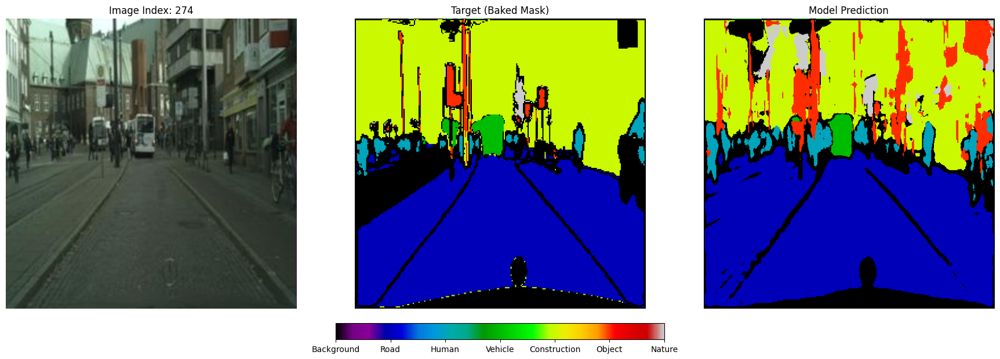

⭐ New Best Model Saved!


Epoch 8/30: 100%|██████████| 372/372 [19:43<00:00,  3.18s/it, loss=0.4647]


🏁 Epoch 8 Summary | Avg Loss: 0.4492


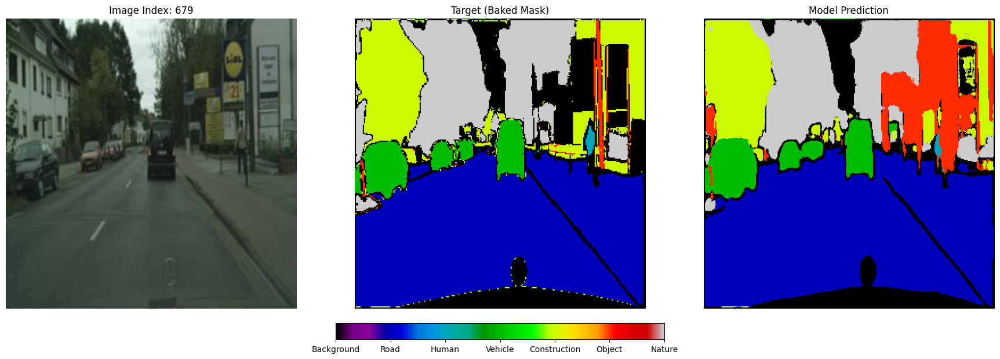

⭐ New Best Model Saved!


Epoch 9/30: 100%|██████████| 372/372 [19:42<00:00,  3.18s/it, loss=0.4504]


🏁 Epoch 9 Summary | Avg Loss: 0.4307


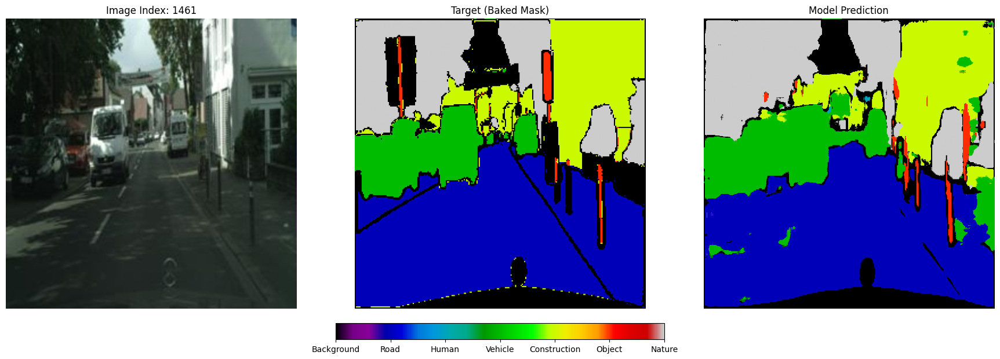

⭐ New Best Model Saved!


Epoch 10/30: 100%|██████████| 372/372 [19:44<00:00,  3.18s/it, loss=0.3424]


🏁 Epoch 10 Summary | Avg Loss: 0.4133


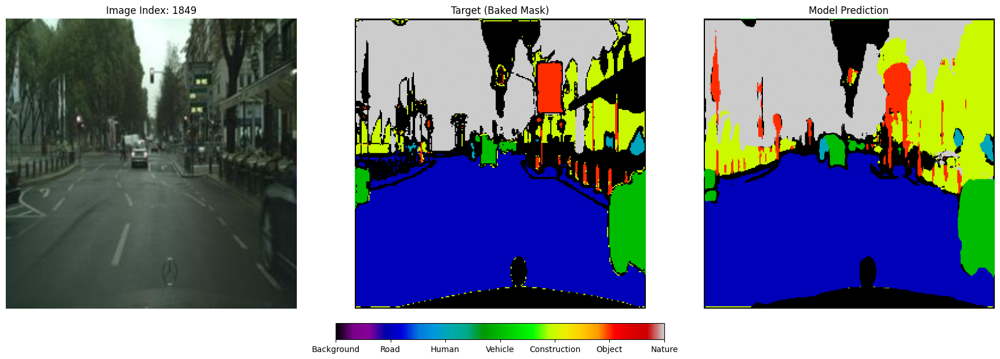

⭐ New Best Model Saved!


Epoch 11/30: 100%|██████████| 372/372 [19:52<00:00,  3.21s/it, loss=0.4501]


🏁 Epoch 11 Summary | Avg Loss: 0.3930


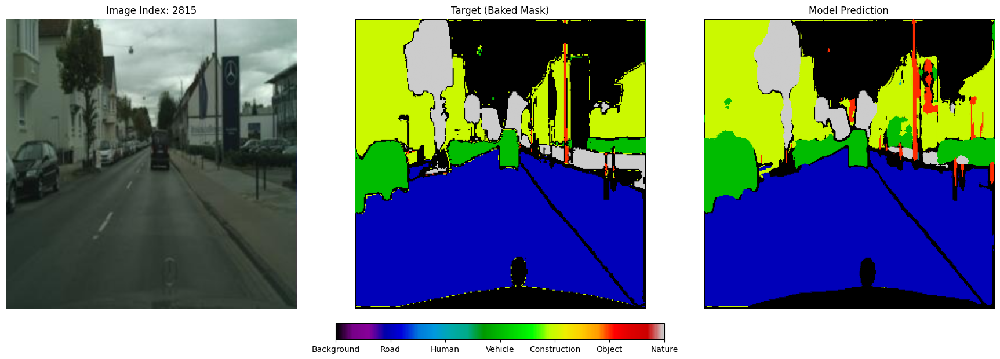

⭐ New Best Model Saved!


Epoch 12/30: 100%|██████████| 372/372 [19:43<00:00,  3.18s/it, loss=0.3703]


🏁 Epoch 12 Summary | Avg Loss: 0.3815


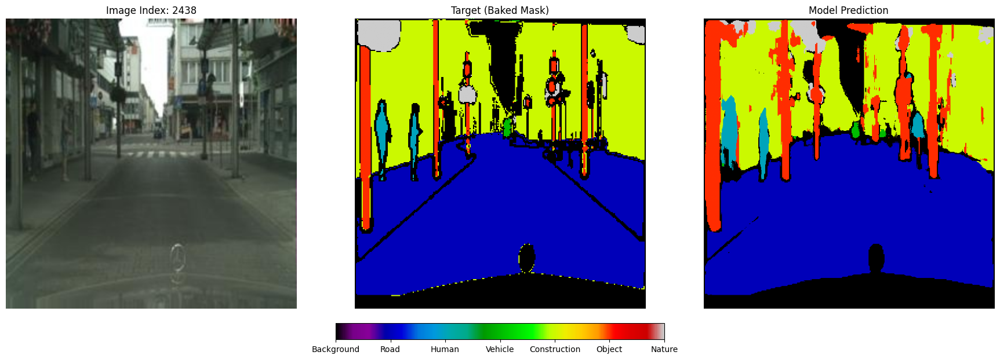

⭐ New Best Model Saved!


Epoch 13/30: 100%|██████████| 372/372 [19:45<00:00,  3.19s/it, loss=0.3444]


🏁 Epoch 13 Summary | Avg Loss: 0.3718


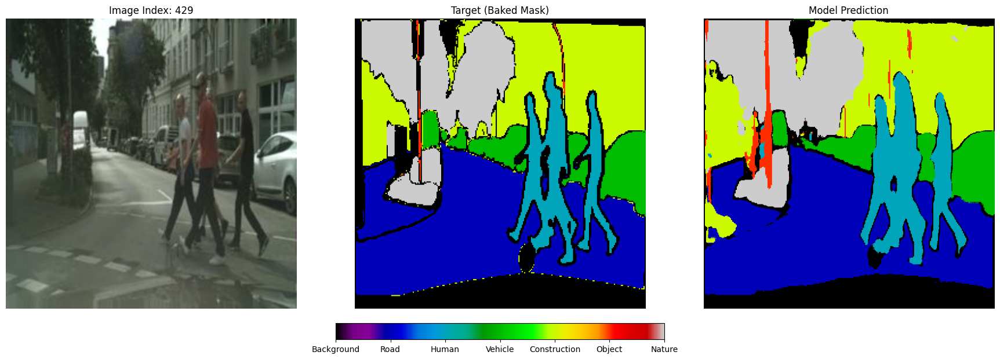

⭐ New Best Model Saved!


Epoch 14/30: 100%|██████████| 372/372 [19:51<00:00,  3.20s/it, loss=0.5507]


🏁 Epoch 14 Summary | Avg Loss: 0.3529


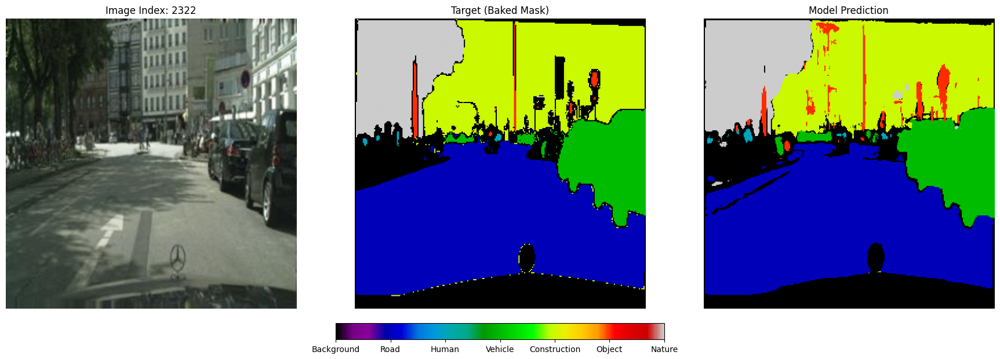

⭐ New Best Model Saved!


Epoch 15/30: 100%|██████████| 372/372 [19:38<00:00,  3.17s/it, loss=0.3886]


🏁 Epoch 15 Summary | Avg Loss: 0.3413


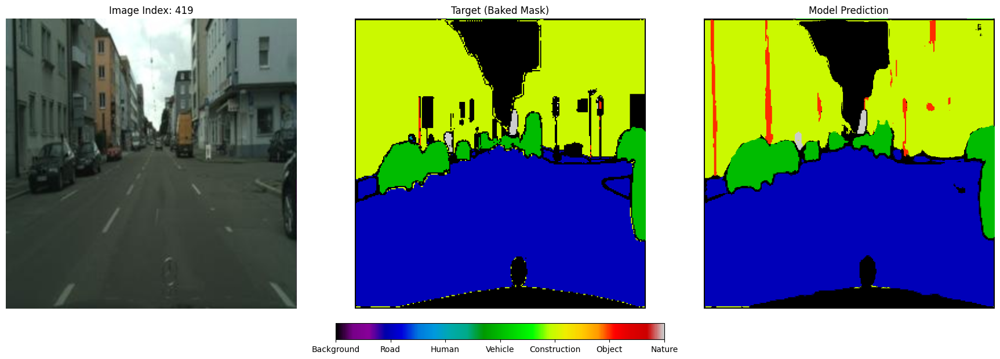

⭐ New Best Model Saved!


Epoch 16/30: 100%|██████████| 372/372 [19:35<00:00,  3.16s/it, loss=0.3429]


🏁 Epoch 16 Summary | Avg Loss: 0.3387


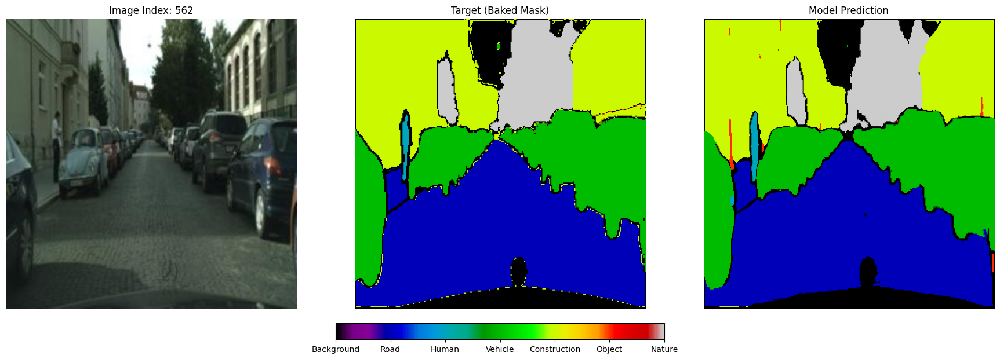

⭐ New Best Model Saved!


Epoch 17/30: 100%|██████████| 372/372 [19:35<00:00,  3.16s/it, loss=0.2537]


🏁 Epoch 17 Summary | Avg Loss: 0.3168


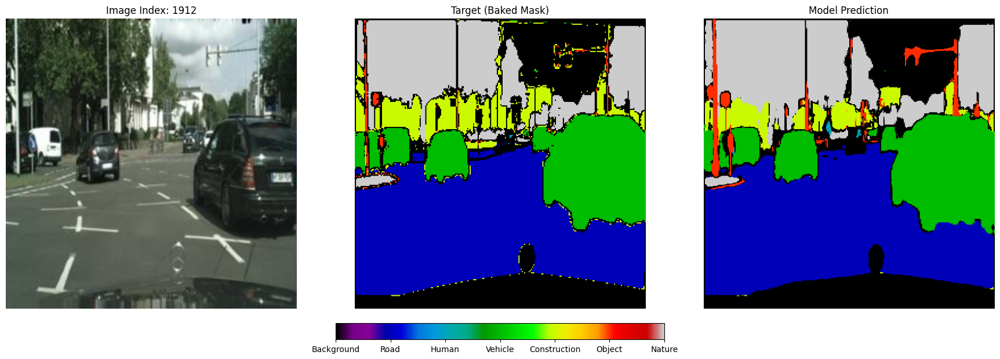

⭐ New Best Model Saved!


Epoch 18/30: 100%|██████████| 372/372 [19:36<00:00,  3.16s/it, loss=0.4032]


🏁 Epoch 18 Summary | Avg Loss: 0.3116


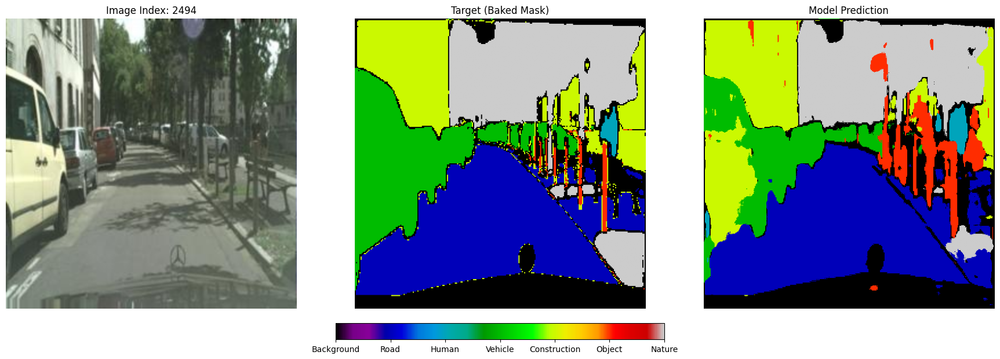

⭐ New Best Model Saved!


Epoch 19/30: 100%|██████████| 372/372 [19:33<00:00,  3.15s/it, loss=0.2754]


🏁 Epoch 19 Summary | Avg Loss: 0.3110


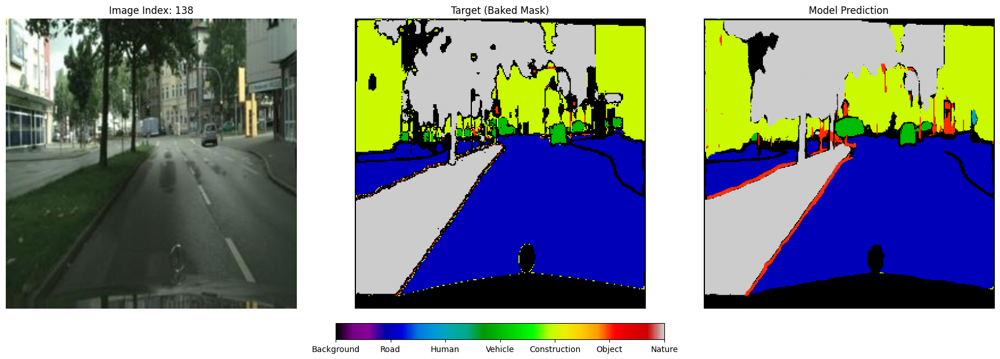

⭐ New Best Model Saved!


Epoch 20/30: 100%|██████████| 372/372 [19:35<00:00,  3.16s/it, loss=0.2620]


🏁 Epoch 20 Summary | Avg Loss: 0.2889


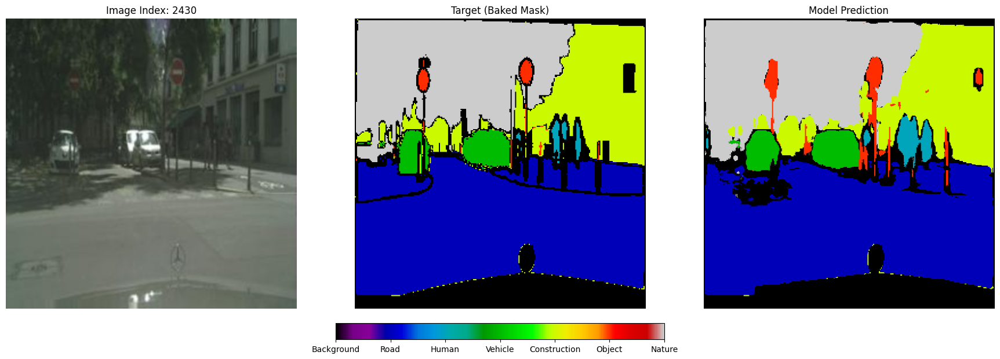

⭐ New Best Model Saved!


Epoch 21/30: 100%|██████████| 372/372 [19:34<00:00,  3.16s/it, loss=0.2873]


🏁 Epoch 21 Summary | Avg Loss: 0.2774


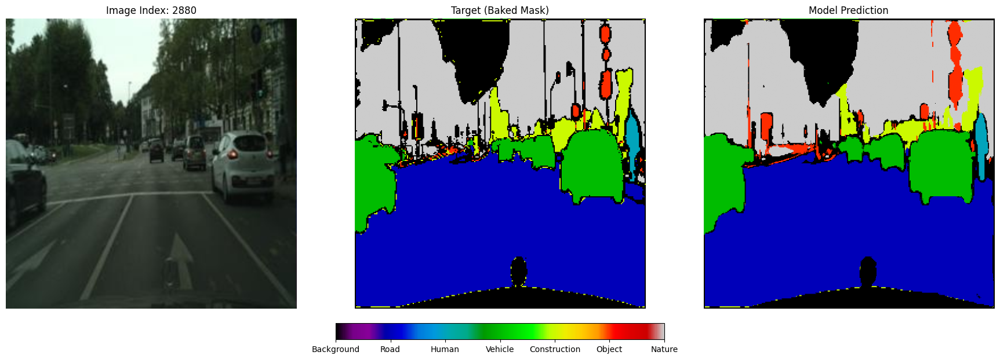

⭐ New Best Model Saved!


Epoch 22/30: 100%|██████████| 372/372 [19:42<00:00,  3.18s/it, loss=0.2567]


🏁 Epoch 22 Summary | Avg Loss: 0.2796


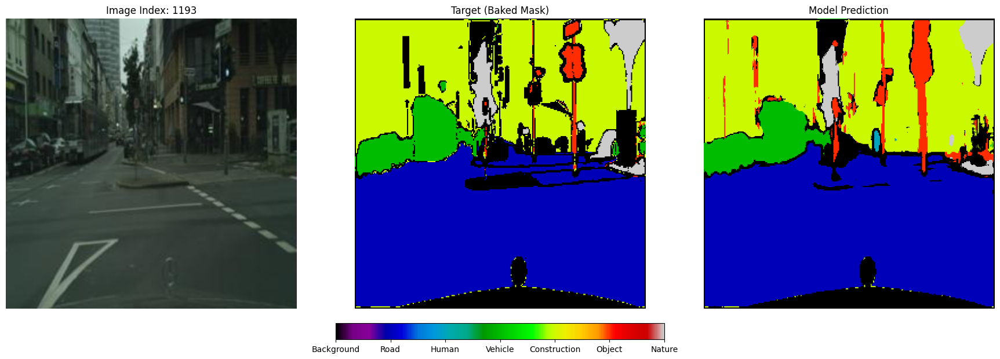

Epoch 23/30: 100%|██████████| 372/372 [19:33<00:00,  3.16s/it, loss=0.4151]


🏁 Epoch 23 Summary | Avg Loss: 0.2642


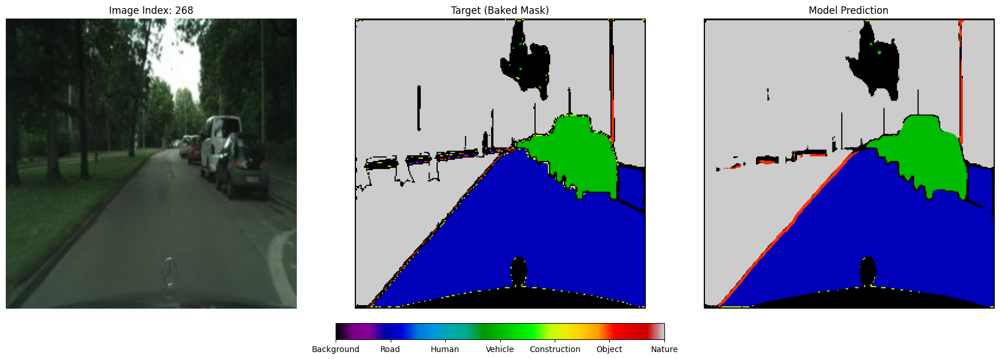

⭐ New Best Model Saved!


Epoch 24/30: 100%|██████████| 372/372 [19:32<00:00,  3.15s/it, loss=0.2515]


🏁 Epoch 24 Summary | Avg Loss: 0.2526


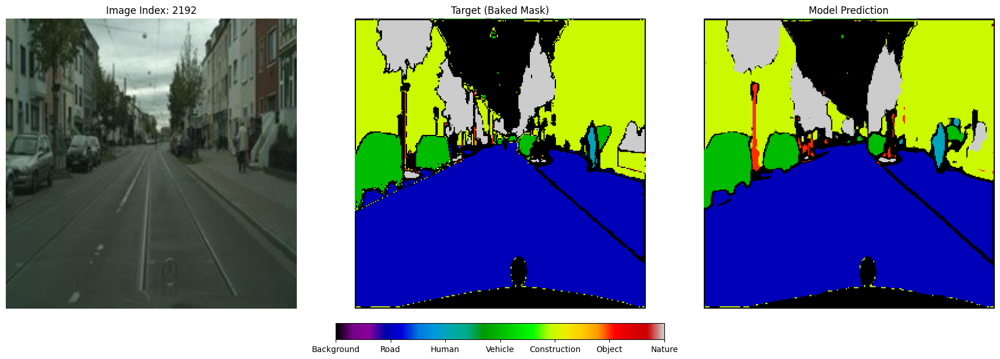

⭐ New Best Model Saved!


Epoch 25/30: 100%|██████████| 372/372 [19:35<00:00,  3.16s/it, loss=0.2302]


🏁 Epoch 25 Summary | Avg Loss: 0.2446


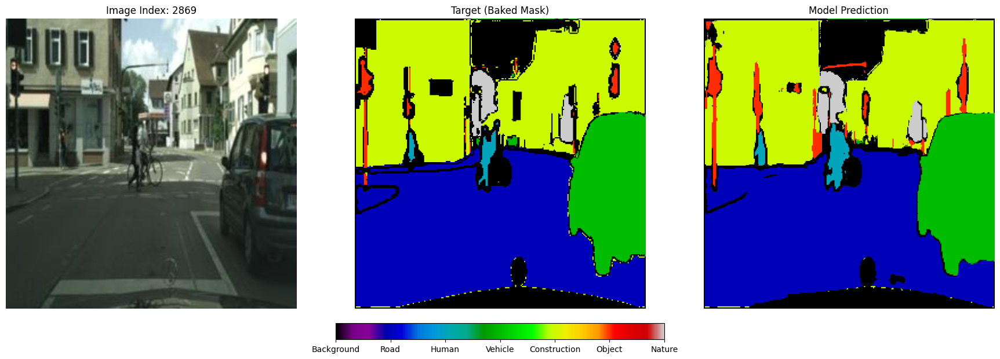

⭐ New Best Model Saved!


Epoch 26/30: 100%|██████████| 372/372 [19:40<00:00,  3.17s/it, loss=0.2395]


🏁 Epoch 26 Summary | Avg Loss: 0.2379


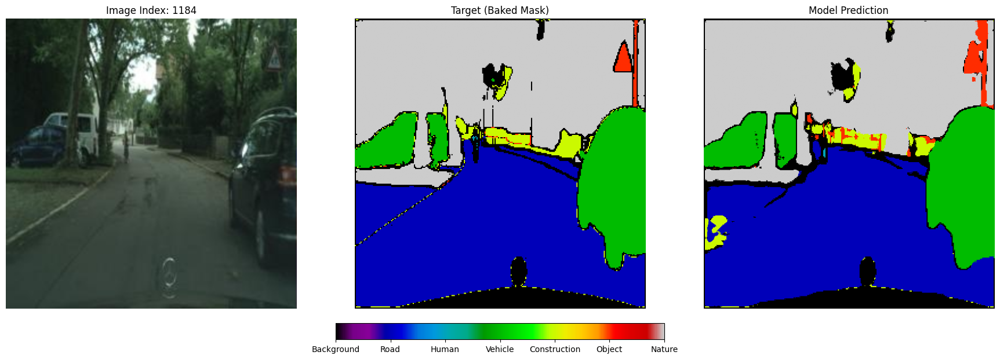

⭐ New Best Model Saved!


Epoch 27/30: 100%|██████████| 372/372 [19:42<00:00,  3.18s/it, loss=0.2306]


🏁 Epoch 27 Summary | Avg Loss: 0.2336


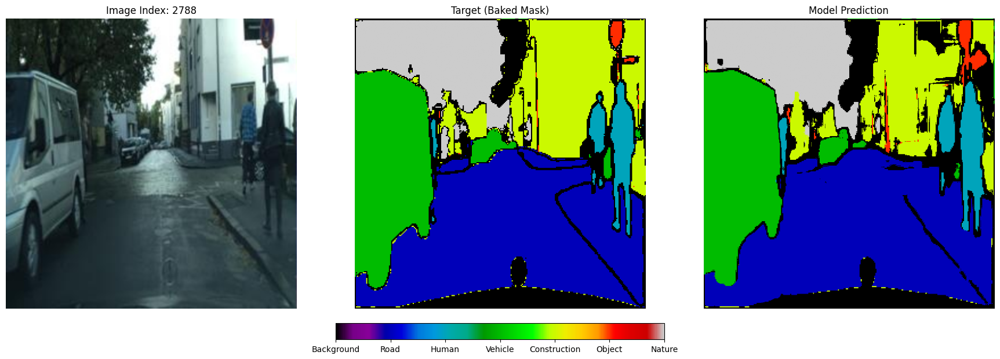

⭐ New Best Model Saved!


Epoch 28/30: 100%|██████████| 372/372 [19:46<00:00,  3.19s/it, loss=0.2615]


🏁 Epoch 28 Summary | Avg Loss: 0.2289


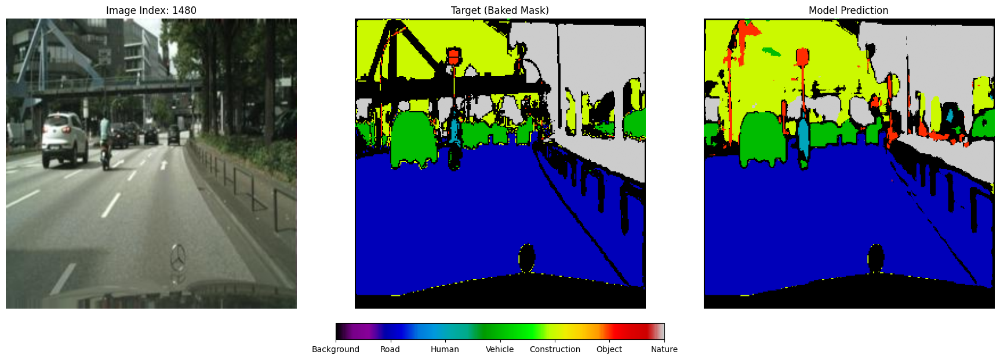

⭐ New Best Model Saved!


Epoch 29/30: 100%|██████████| 372/372 [19:38<00:00,  3.17s/it, loss=0.2557]


🏁 Epoch 29 Summary | Avg Loss: 0.2170


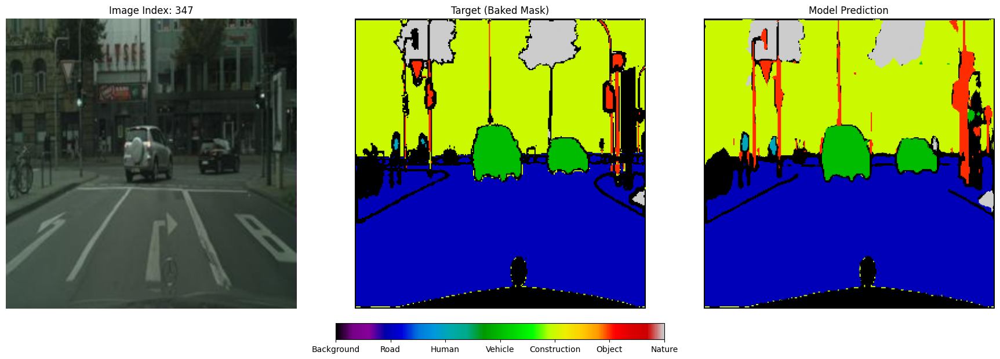

⭐ New Best Model Saved!


Epoch 30/30: 100%|██████████| 372/372 [19:43<00:00,  3.18s/it, loss=0.2058]


🏁 Epoch 30 Summary | Avg Loss: 0.2066


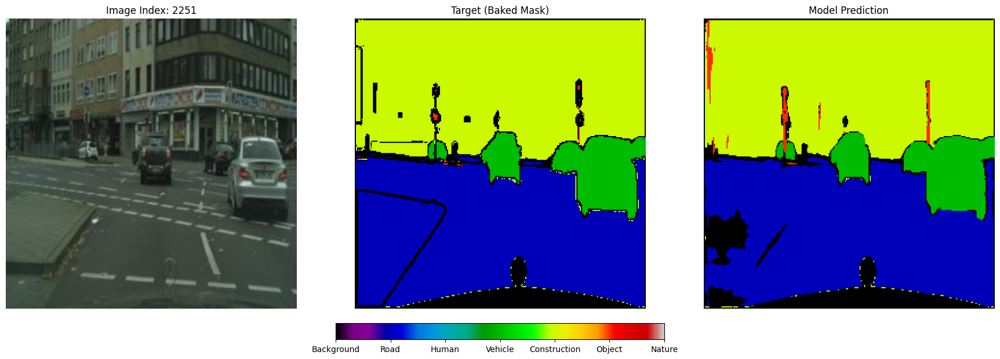

⭐ New Best Model Saved!


In [ ]:
from tqdm import tqdm

# Hyperparameters
EPOCHS = 30
best_loss = float('inf')

print(f"📡 Starting 512x512 training on {device}...")

for epoch in range(EPOCHS):
    model_instance.train()
    running_loss = 0.0
    
    pbar = tqdm(enumerate(train_loader), total=len(train_loader), desc=f"Epoch {epoch+1}/{EPOCHS}")
    
    for batch_idx, (images, masks) in pbar:
        images, masks = images.to(device), masks.to(device)
        
        # 1. Forward pass
        outputs = model_instance(images)
        loss = criterion(outputs, masks)
        
        # 2. Backward pass & Optimization
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()
        
        running_loss += loss.item()
        pbar.set_postfix({'loss': f"{loss.item():.4f}"})
    
    # --- END OF EPOCH LOGIC ---
    avg_epoch_loss = running_loss / len(train_loader)
    print(f"🏁 Epoch {epoch+1} Summary | Avg Loss: {avg_epoch_loss:.4f}")
    
    # 3. VISUALIZE using your existing function
    visualize_with_labels(model_instance, train_ds, device)
    
    # 4. Save the "Best" Model
    if avg_epoch_loss < best_loss:
        best_loss = avg_epoch_loss
        torch.save(model_instance.state_dict(), "cityscapes_512_best.pth")
        print(f"⭐ New Best Model Saved!")